 # Introduction: Modelling the effects of discounts

Modelling consumer behaviour is a key component of optimizing pricing for products, and this project provides a way of inferring the distribution of prices individuals are prepared to pay for a given product, based on how offering an incentive (in this case, a discount), affects their purchasing behaviour. Here, we have a population of agents who are offered an option at one price, and then again at a reduced/discounted price. You have recorded both of the choices of each agent, and the goal here is to predict how other agents from this population will behave for different discount magnitudes, with the eventual aim of optimizing the final price, in terms of a profit margin/units sold trade-off.

This model is based on the standard economics characterization individuals as rational agents, whose buying behaviour is based on a fixed "reserve price" for each individual, where an individual buys a product if and only if it falls below their reserve price. We do not observe the reserve price for each agent, but we hope that, under reasonable assumptions, we can learn about its distribution from our purchasing data, and generalize this to larger or smaller discounts, predicting how the agents will behave. By assuming that each individual's reserve price is drawn from a common Gaussian distribution, we are able to straightforwardly compute the joint probability for all possible outcomes, which allows straightforward computation of the likelihood of the model, given some data.

We simulate data under our model, and use Markov Chain Monte Carlo (MCMC) to sample from the posterior distribution for our model, with the inclusion of relevant prior distributions for the mean and variance of the reserve price distribution, and compare the sampled parameter values to the ground truth for various incentive levels. We also modify our model to account for "haters" (those who would not buy the product for any price), and investigate the effects that the inclusion of this parameter has on the behaviour of the MCMC chain.


In [1]:
using PyPlot
using StatsBase
using Distributions
using SpecialFunctions
PyPlot.svg(true);

 # Defining the likelihood function
We assume that the reserve price for all individuals is a random draw from a normal distribution, with mean $\mu$ and variance $\sigma^2$, and we record whether a given individual purchases at the original price, and whether they purchase at the reduced price. This gives 4 theoretical outcomes for pre- and post-incentive purchase behaviour: TT, TF, FT and FF, where $T$ = buying the product and $F$ = not buying the product. 

If we denote the first purchase decision as $D_1$ and the second as $D_2$, we can define the probability of each choice as follows, given x as the latent variable decribing the distribution of reserve prices:

$P(D_1=T|x)$ is 1 when price < x, or 0 otherwise.

$P(D_1=F|x) = 1-P(D_1=T|x)$

$P(D_2=T|x)$ is 1 when price - incentive < x, or 0 otherwise.

$P(D_2=F|x) = 1-P(D_2=T|x)$

Further, we can combine the two decisions in the following ways, to define the probabilites for our 4 possible outcomes:

$P(D_1,D_2) =\int_{x} P(D_1,D_2|x)P(x)$, where $P(D_1,D_2|x) = P(D_1|x)(P(D_2|x)$

If we assume that the latent variable x is normally distributed:
$P(D_1,D_2) = \int_{-\infty}^{\infty} P(D_1|x)(P(D_2|x) N(x;\mu,\sigma^2) dx$

Which gives us the following results in terms of a Normal cdf:

$P(TT) = \int_{price}^{\infty} N(\mu,\sigma)= 1-\Phi(price)$,
where $\Phi$ is the associated normal cdf.
              
$P(FT)= \int_{saleprice}^{price} N(\mu,\sigma) = \Phi(price)-\Phi(sale price)$

$P(FF) = \int_{-\infty}^{saleprice} N(\mu,\sigma) = \Phi(sale price)$

As the decision to buy is based solely on whether the asking price is below an individual's reserve price, which is fixed per individual, and our incentive is a discount on the original price, a "TF" outcome is not possible, as it would require the individual to buy at the higher initial price but not at the lower one.

We may also want such a model to account for the case where some agents will never make such a purchase, and we include a proportion of such "haters" into our likelihood function.

We are also able, by assuming independence between individuals, to compute a log likelihood for the model, given count data for each outcome (i.e. the number of individuals who fall into each of the categories).

In [63]:
function normcdf(mu::Float64,sigma::Float64,x::Array{Float64,1})
    return 0.5*(1-erf.((mu-x)/(sqrt(2)*sigma)))
end

function joint_prob(mu::Float64,sigma::Float64,price::Float64,incentive::Float64)
    tt = 1-normcdf(mu,sigma,[price])
    tf = 0.0
    ft = normcdf(mu,sigma,[price])-normcdf(mu,sigma,[price-incentive])
    ff = normcdf(mu,sigma,[price-incentive])
    return (tt[1],tf,ft[1],ff[1])
end

#Modified probabilities, incorporating a "haters" parameter, which encodes the probability that an individual will never by the product, irrespective of discount. Setting haters to 0 reverts to the previous function.
function joint_prob(mu::Float64,sigma::Float64,price::Float64,incentive::Float64,haters::Float64)
    tt = (1-haters)*(1-normcdf(mu,sigma,[price]))
    tf = 0.0
    ft = (1-haters)*(normcdf(mu,sigma,[price])-normcdf(mu,sigma,[price-incentive]))
    ff = (1-haters)*normcdf(mu,sigma,[price-incentive])+haters
    return (tt[1],tf,ft[1],ff[1])
end

#Defining the log likelihood for this model, for a population of individuals, using the counts obtained from the data
function jointLF(mu::Float64,sigma::Float64,price::Float64,incentive::Float64,haters::Float64,tt_count::Int64,tf_count::Int64,ft_count::Int64,ff_count::Int64)
    (tt,tf,ft,ff) = joint_prob(mu,sigma,price,incentive,haters);
    return log(tt[1])*tt_count+log(ft[1])*ft_count+log(ff[1])*ff_count;
end

jointLF (generic function with 1 method)


## Sampling from the posterior distribution
Bayesian inference allows us to capture the full uncertainty in the distribution of our unknown parameters, given the data (which we will simulate for our purposes later in this notebook). Using Bayes' Rule, we are able to write an expression for the distribution of the parameters given the counts TT, FT and FF, and where $h$ is the proportion of "haters".

$$ P(\mu, \sigma, h|TT, FF, FT) = \frac{P(TT, FF, FT|\mu,\sigma, h)P(\mu,\sigma,h)}{\int_{\mu}\int_{\sigma}\int_{h}P(TT, FF, FT|\mu,\sigma, h)P(\mu,\sigma,h)} $$


The integrals in the denominator of the above expression are particularly difficult to compute, but Markov Chain Monte Carlo allows us to sample from the posterior distribution over our parameters (the expression on the right) without having to compute this integral at all. Here, we use the Metropolis-Hastings algorithm, allowing us to sample from the posterior distribution for our model (under a Bayesian framework), without calculating the normalization constant, as the product of the prior distributions and the likelihood is proportional to the posterior distribution.

Working in the log domain allows us to avoid underflow. We generate random perturbations of the parameters, and accept if the log likelihood improves, but reject some proportion of the new values, with a probability proportional to how much worse they make the likelihood. Intuitively, this ensures that we preferentially sample regions of higher density in our posterior distribution. Stronger than this, the Metropolis-Hastings algorithm generates samples in proportion to their relative posterior density.

In later sections, we will use this implementation, in conjunction with data simulated under our model, to infer values of $\mu$, $\sigma$ and, optionally, the "haters" parameter.

In [3]:
#functions for MCMC inference for mu, sigma and haters parameters

#Setting the parameter priors
function mu_prior(x)
    return logpdf(Normal(500,2000),x)
end

function sigma_prior(x)
    return logpdf(Exponential(300),x)
end

function haters_prior(x)
    return logpdf(Uniform(),x)
end

#Does the actual MCMC inference.
function incentive_MCMC(price,incentive,sample_haters,tt_count,tf_count,ft_count,ff_count;chain_length = 10000000, tuning = 3.0, dump_every = 2000)
    chain = []
    mu = 900.0
    sigma = 90.0
    haters=0.0
    newhaters = haters
    accepts = 0

    currentLL =  jointLF(mu,sigma,price,incentive, haters, tt_count,tf_count,ft_count,ff_count) + mu_prior(mu) + sigma_prior(sigma) + haters_prior(haters)
    for iter in 1:chain_length
        newmu,newsigma = (mu,sigma).+randn(2)*tuning
        if sample_haters
            newhaters = haters+randn()*tuning*0.2
        end
        #Exclude disallowed proposals
        if newsigma>0 && 0<=newhaters<=1
            newLL = jointLF(newmu,newsigma,price,incentive, newhaters,tt_count,tf_count,ft_count,ff_count) + mu_prior(newmu) + sigma_prior(newsigma) + haters_prior(newhaters)
        else
            newLL = -Inf
        end
        #Standard metropolis acceptance rule
        if e^(newLL-currentLL)>rand()
            accepts += 1
            currentLL = newLL
            mu,sigma = (newmu,newsigma)
            haters=newhaters
        end
        if mod(iter,dump_every)==0
            push!(chain,[currentLL,mu,sigma,haters])
        end
    end
    println("Acceptance rate: ", accepts/chain_length)
    return chain
end

incentive_MCMC (generic function with 1 method)

 # Simulating data


This function simulates data under our model. We specify our $\mu$, $\sigma$ for the "reserve price" distribution, the price and discount, and the number of individuals, as well as the proportion of "haters".

In [4]:
#Simulating data under our model
function simulate(mu::Float64,sigma::Float64,price::Float64,incentive::Float64,haters::Float64,num_agents::Int64)
    x=[ifelse(rand()<haters, -Inf, randn()*sigma + mu) for i in 1:num_agents]

    pre_choice = [i>price for i in x];
    post_choice = [i>(price-incentive) for i in x];

    obs_pairs = [(pre_choice[i],post_choice[i]) for i in 1:length(pre_choice)];

    counting = countmap(obs_pairs)
    tt_count = sum([i==(true,true) for i in obs_pairs])
    tf_count = sum([i==(true,false) for i in obs_pairs])
    ft_count = sum([i==(false,true) for i in obs_pairs])
    ff_count = sum([i==(false,false) for i in obs_pairs])
    
    return (tt_count,tf_count,ft_count,ff_count)
end

simulate (generic function with 1 method)

# Plots


This function plots samples from the posterior distribution, as well as the true values used to generate the data. We also compare curves for the posterior distribution samples and their mean to those derived from the true values, for different increments of the incentive, to see how our inference performs for unsampled incentive sizes.

In [16]:
#Plot samples from the posterior distributions (blue), as well as the true model parameters (red).    
function plot_samples(ch, latent_mean::Float64, latent_sd::Float64, latent_haters::Float64, sample_haters)
    var_names = ["mu","sigma","haters"]
    true_vals = [latent_mean,latent_sd,latent_haters]
    up = ifelse(sample_haters,3,2)
    for m in 1:up
        for n in m+1:up
            plot([i[m+1] for i in ch[Int64(end/2):end]],[i[n+1] for i in ch[Int64(end/2):end]],".",alpha=0.2)
            plot([true_vals[m]],[true_vals[n]],".",color="red")
            xlabel(var_names[m])
            ylabel(var_names[n])
            figure()
        end
    end
end

function get_curves(ch, price::Float64, incentive::Float64; upper_bound = 2)
    sl = 100
    tt = zeros(sl)
    tf = zeros(sl)
    ft = zeros(sl)
    ff = zeros(sl)
    sizes = zeros(sl)

    for i in 1:sl
        size = ((i-1)/100)*upper_bound
        sizes[i] = size
        mu,sigma,haters = ch[2:end]
        (a,b,c,d) = joint_prob(mu,sigma,price,incentive*size, haters);
        tt[i] = a
        tf[i] = b
        ft[i] = c
        ff[i] = d
    end
    return tt,tf,ft,ff,sizes
end

#Plots the posterior curves, posterior mean curves, as well as the true curves.

function posterior_plots(ch, latent_mean,latent_sd, latent_haters, price, incentive)
    upper_b = 3 #upper bound of the plot. 0 is no intervention, 1 is the measured intervention.

    meanmu = mean([i[2] for i in ch[Int64(end/2):end]])
    meansigma = mean([i[3] for i in ch[Int64(end/2):end]])
    meanhaters= mean([i[4] for i in ch[Int64(end/2):end]])
    tt,tf,ft,ff,sizes = get_curves([0,meanmu,meansigma, meanhaters],price, incentive, upper_bound=upper_b)
    plot(sizes,tt,color="red",linestyle="dashed",label="posmean TT")
    plot(sizes,tf,color="green",linestyle="dashed",label="posmean TF")
    plot(sizes,ft,color="blue",linestyle="dashed",label="posmean FT")
    plot(sizes,ff,color="grey",linestyle="dashed",label="posmean FF")

    tt,tf,ft,ff,sizes = get_curves([0,latent_mean,latent_sd, latent_haters], price, incentive, upper_bound=upper_b)
    plot(sizes,tt,color="red",linestyle="dotted",label="real TT")
    plot(sizes,tf,color="green",linestyle="dotted",label="real TF")
    plot(sizes,ft,color="blue",linestyle="dotted",label="real FT")
    plot(sizes,ff,color="grey",linestyle="dotted",label="real FF")

    for ch in sample(ch[Int64(end/2):end],400,replace=false)
        tt,tf,ft,ff,sizes = get_curves(ch, price, incentive, upper_bound=upper_b)
        plot(sizes,tt,color="red",alpha=0.02)
        plot(sizes,tf,color="green",alpha=0.02)
        plot(sizes,ft,color="blue",alpha=0.02)
        plot(sizes,ff,color="grey",alpha=0.02)
    end
xlabel("Intervention Size")
ylabel("Frequencies")
legend();
end

posterior_plots (generic function with 1 method)

# Results (version 1)


This set of results involves simulating data without using the haters parameter, and using our MCMC to sample from teh posterior distribution, then comparing the resulting values of $\mu$ and $\sigma$ to those the true values.

For the simulation, we use the following values:

$\mu$ = 1000

$\sigma$ = 100

price = $1000
 
incentive (discount) = $50
     
n = 1000 (1000 individuals sampled)

In [8]:
sim_data=simulate(1000.0,100.0,1000.0,50.0,0.0,1000);

In [9]:
chain = incentive_MCMC(1000.0,50.0,false,sim_data[1], sim_data[2], sim_data[3], sim_data[4];tuning = 8.0);

Acceptance rate: 0.3826903


# Traces and effective sample size calculations

We examine samples from the second half of the chain (to avoid the burn in), and calculate the effective sample size for each of our parameters, as shown below. We see excellent mixing and a large effective sample size for both.

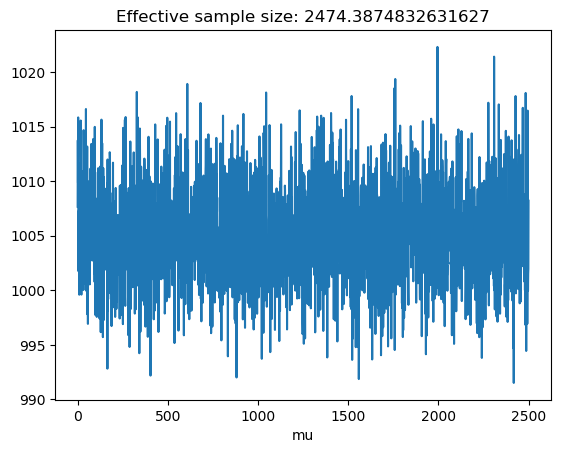

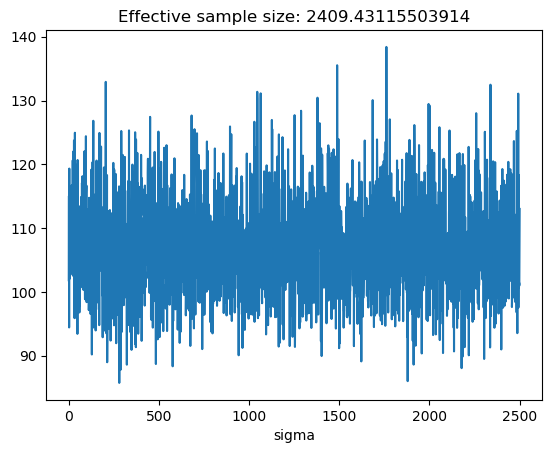

In [45]:
var_names = ["mu","sigma"]
for m in 1:2
    scalar_chain = [i[m+1] for i in chain[Int64(end/2):end]];
    plot(scalar_chain)
    xlabel(var_names[m])
    title("Effective sample size: "*string(effective_sample_size(scalar_chain)))
    figure()
end

We then plot the MCMC-obtained estimates for $\mu$ and $\sigma$ (blue), with the true values used to generate the data shown in red. We see that the sampled values include the true values.

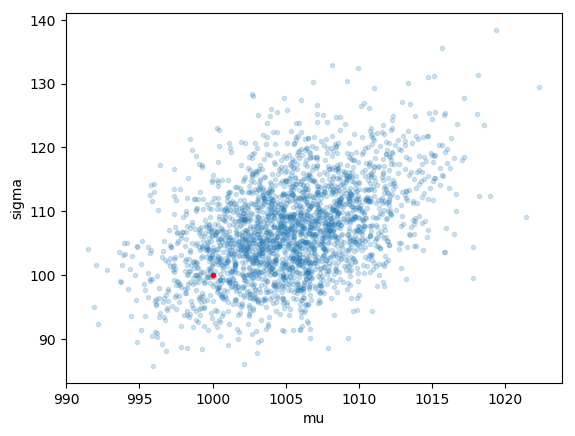

In [10]:
plot_samples(chain, 1000.0,100.0,0.0,false)

# Visualizing the posterior predictive distribution

Here, we compare the true proportions of TT, TF FT, and FF to both the mean values of these proportions in our sample, and to individual samples from the posterior predictive distribution. Even though our data come from an intervention of a single magnitude, we might want to ask what might happen for interventions of different magnitudes, given the remaining uncertainty in the parameters inferred from our measured intervention. We plot these here, with our intervention calibrated to be 1.0 on the x-axis, so that 2.0 on the x-axis corresponds to a discount of twice that used in our simulation, or 100 USD. We see that the mean values are very close to the true values. The faint lines each represent a sample from the posterior predictive distribution, generated from an MCMC-sampled pair of parameter values, as the discount size varies. The spread in the faint lines for larger discounts indicates that the uncertainty in our parameters translates into more variable agent behaviour for larger incentive sizes.

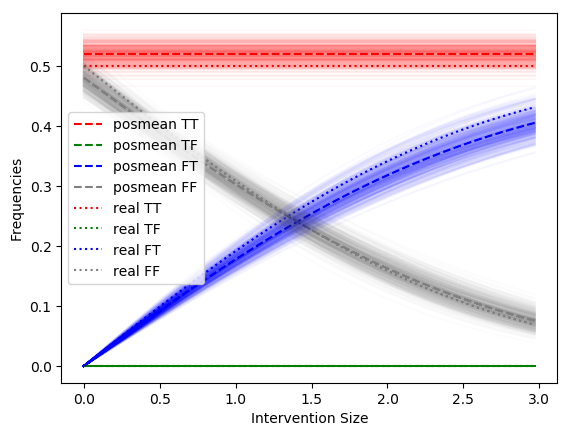

PyObject <matplotlib.legend.Legend object at 0x13e0c65f8>

In [11]:
posterior_plots(chain, 1000.0,100.0, 0.0,1000.0, 50.0)

# Results (With haters)

We now make use of the "haters" parameter, set at 0.3, with all the values as before. 

In [12]:
sim_data2=simulate(1000.0,100.0,1000.0,50.0,0.3,1000)

(349, 0, 131, 520)

In [54]:
chain2 = incentive_MCMC(1000.0,50.0,true,sim_data2[1], sim_data2[2], sim_data2[3], sim_data2[4];tuning= 3.0);

Acceptance rate: 0.0465314


# Traces and effective sample size calculations

As before, we examine samples from the second half of the chain (to avoid the burn in), and calculate the effective sample size for each of our parameters. As expected for this more challenging set of parameters, we see less uniform mixing and a smaller effective sample size, although still of reasonable magnitude.

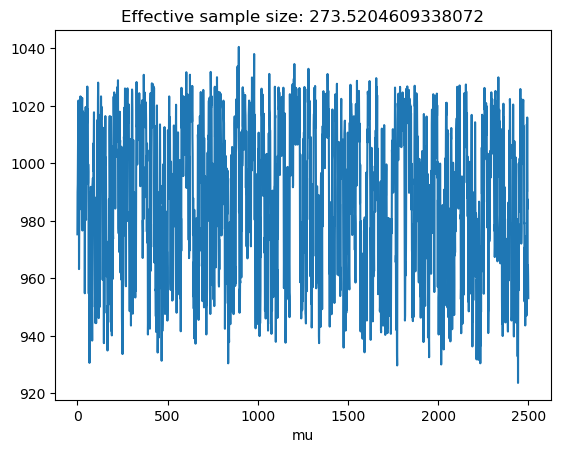

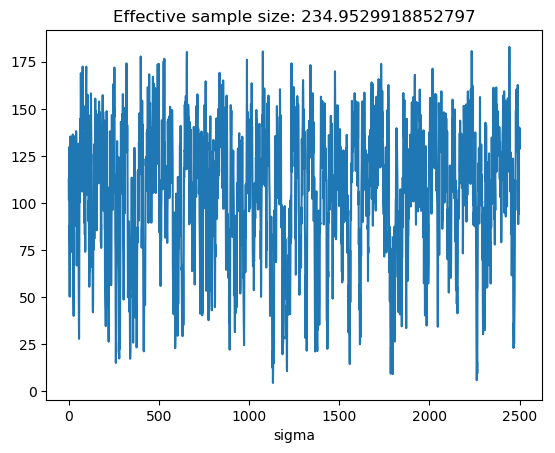

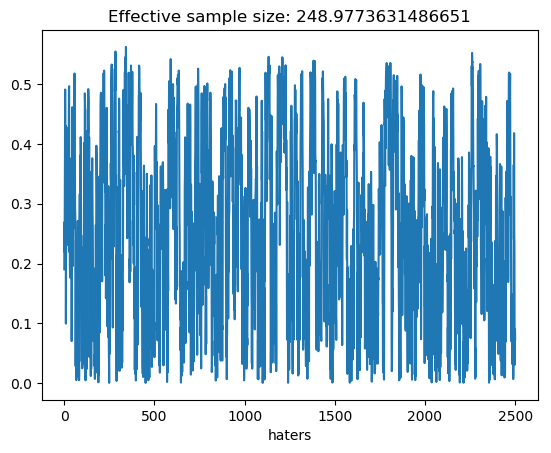

In [55]:
var_names = ["mu","sigma","haters"]
for m in 1:3
    scalar_chain = [i[m+1] for i in chain2[Int64(end/2):end]];
    plot(scalar_chain)
    xlabel(var_names[m])
    title("Effective sample size: "*string(effective_sample_size(scalar_chain)))
    figure()
end

As we are now sampling 3 values ($\mu$, $\sigma$ and "haters"), we can plot 3 pairwise scatter graphs. This shows that, although we are sampling around the true value, there is strong correlational structure between the parameters in our model. For example, our observed frequencies can be explained by having a high mean reserve price, and a lot of haters, or a lower mean reserve price, and few haters, which makes intuitive sense.

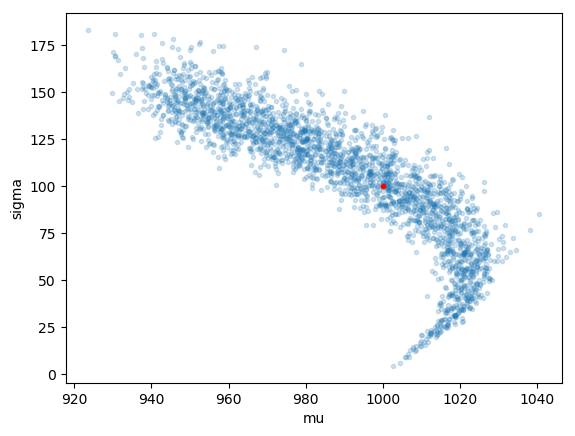

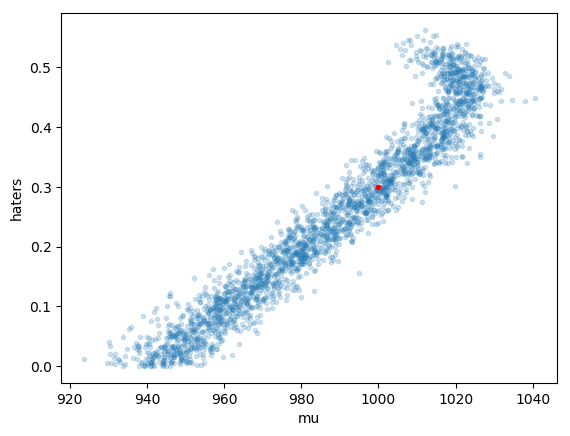

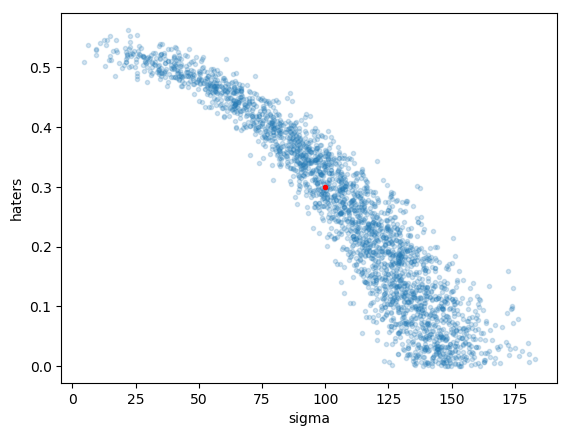

In [56]:
plot_samples(chain2, 1000.0,100.0,0.3,true)

Again, our true value is contained within the region of high posterior density, but this time that region is far more diffuse. When we try and extrapolate behavior to different incentive magnitudes, we see that our model has captured the extensive uncertainty in these forecasts.

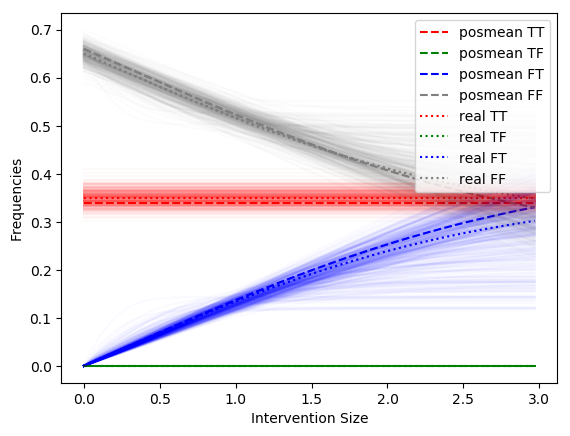

PyObject <matplotlib.legend.Legend object at 0x150d1def0>

In [58]:
posterior_plots(chain2, 1000.0,100.0, 0.3, 1000.0, 50.0)

# Discussion

There are numerous directions in which we could develop this model, a few of which are described below:

1) Generalizing our model to account for noisy behaviour on the part of our agents. Currently, the indicator functions $P(D_1=T|x)$ and $P(D_2=T|x)$ encode rational, consistent behaviour based on the reserve price (x), but replacing these functions with a logistic function would allow for noisier behaviour, with the slope of the function controlling the amount of noise in agent behaviour. In this case, the likelihood function would no longer be a straightforward computation, and numerical methods would be required to calculate it. An alternative method to add noise to the model would be to allow the agent reserve price itself to vary between the 1st and 2nd offer. 

2) Another option would be to allow the latent variable distribution to be more flexible; for example, represented by a mixture of guassians, or even fully non-parametric, using an infinite Gaussian mixture model for the latent variable (https://www.seas.harvard.edu/courses/cs281/papers/rasmussen-1999a.pdf). We could also simulate our latent variable using draws from a different distribution than our model assumes, and see what effect the erroneous assumption has on our inference.

3) Finally, we could allow inference for data with more than a single intervention size, adding power to model the effects of a range of discounts, and to learn much more about the distribution of latent variables under more flexible models, which could be more informative for business applications.